Importing data

In [1]:
#NOTE: Because our timestamps consisted of null values removing them would  result in our column having 1132

import pandas as pd

#We import our data, 
df = pd.read_csv("data/CG/Expert/E_ID1/Es1/Raw/TimeStamp011214_103748.csv")
#Due there is an unregistered column we delete it
del df["Unnamed: 1"]

#Rename  the first column in order to be able to convert unix timestamp values to:
#Date and time
column_names= ["TimeStamp"]
df.columns=column_names

#Conversion to date and time
df=pd.to_datetime(df["TimeStamp"],unit='ns')
print(df)

0      1970-01-01 00:00:20.622442942
1      1970-01-01 00:00:20.622783803
2      1970-01-01 00:00:20.623112876
3      1970-01-01 00:00:20.623442884
4      1970-01-01 00:00:20.623783751
                    ...             
1128   1970-01-01 00:00:21.000110206
1129   1970-01-01 00:00:21.000440154
1130   1970-01-01 00:00:21.000781021
1131   1970-01-01 00:00:21.001110202
1132   1970-01-01 00:00:21.001440141
Name: TimeStamp, Length: 1133, dtype: datetime64[ns]


C:\Users\upshl\AppData\Local\Temp\ipykernel_22508\3056477297.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


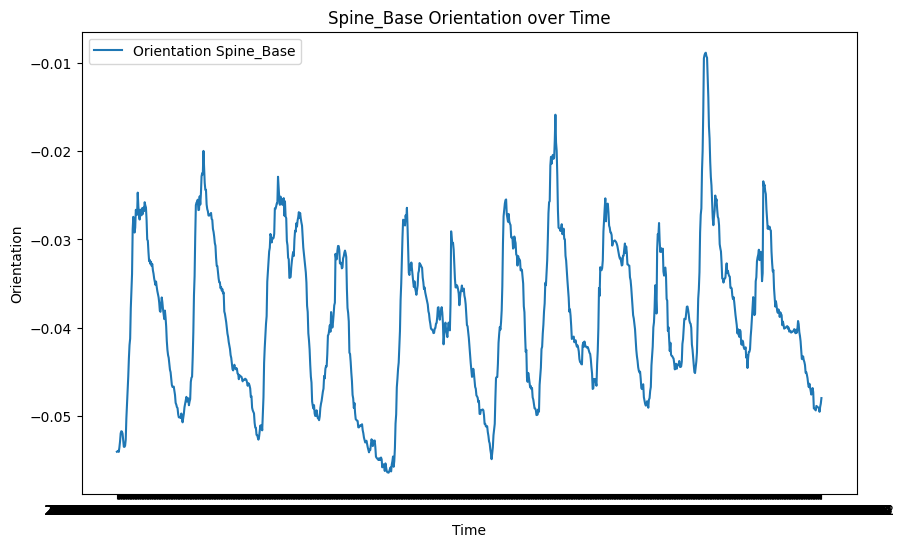

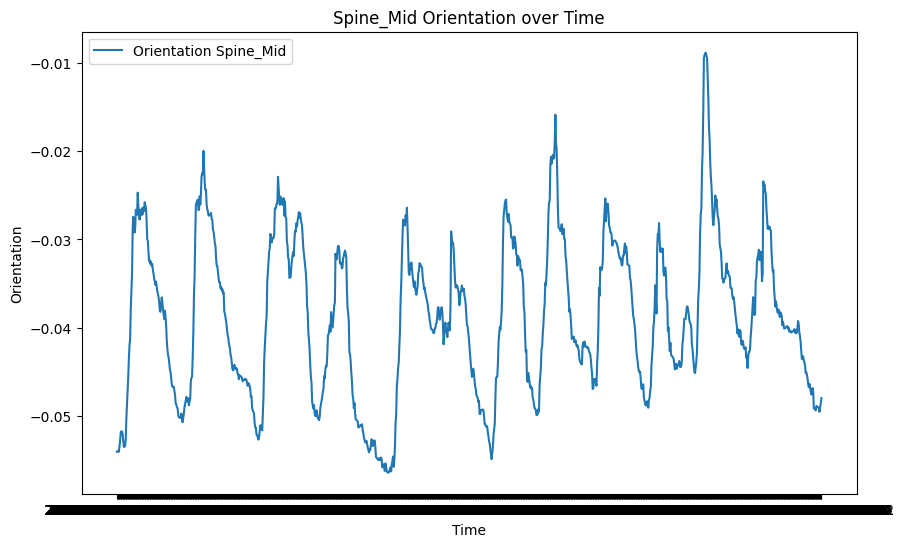

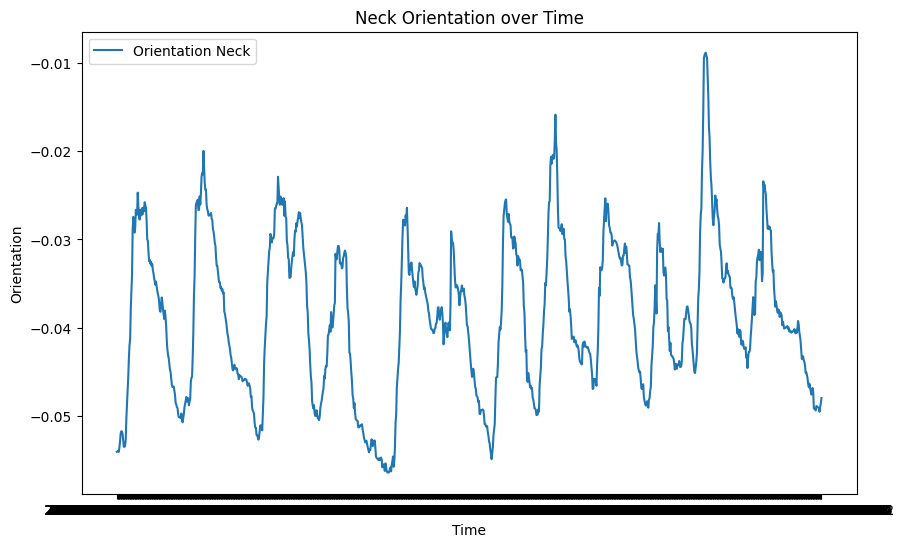

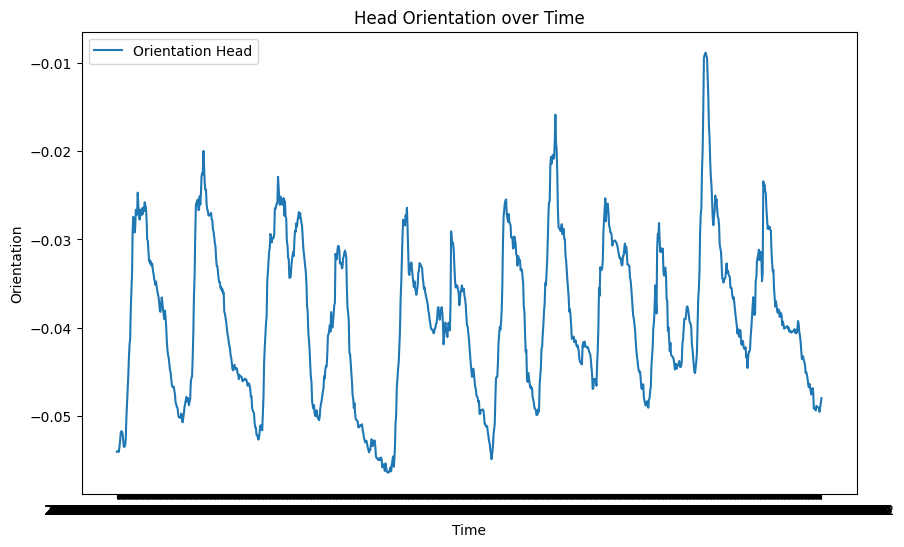

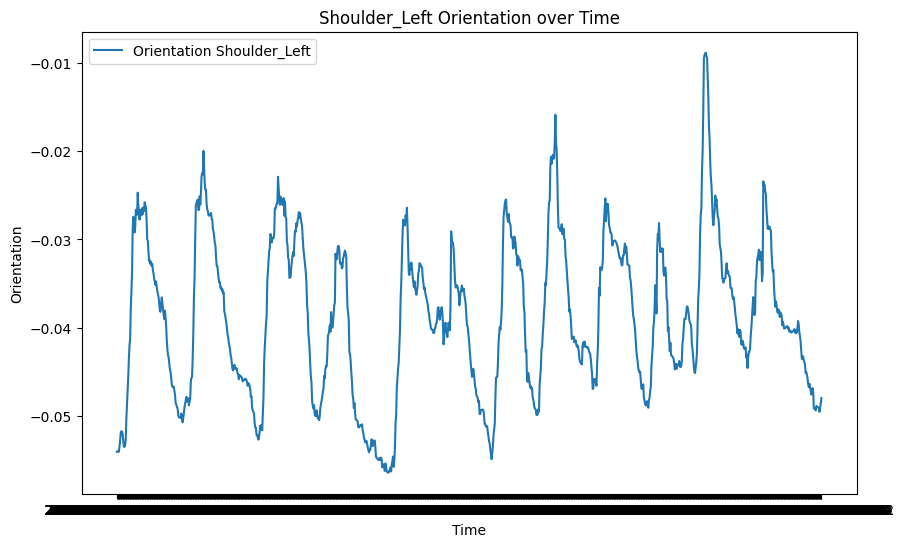

...

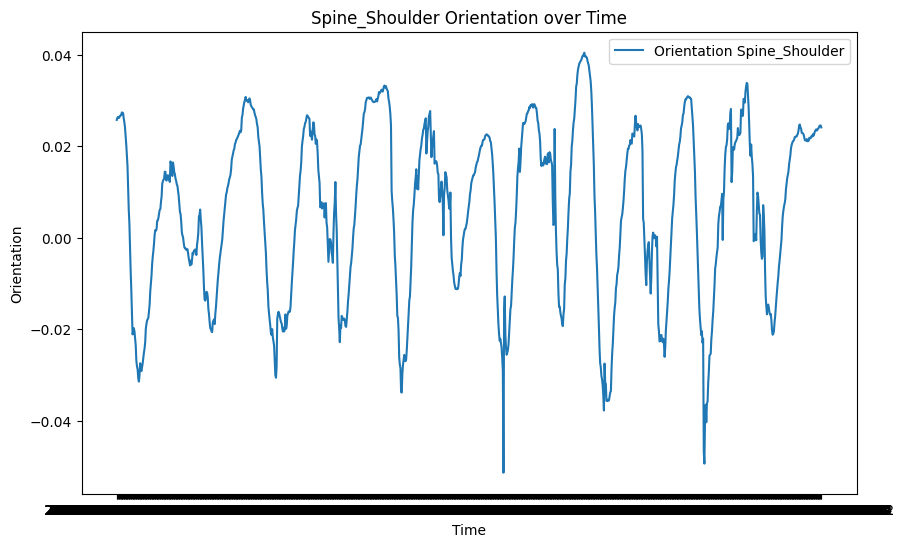

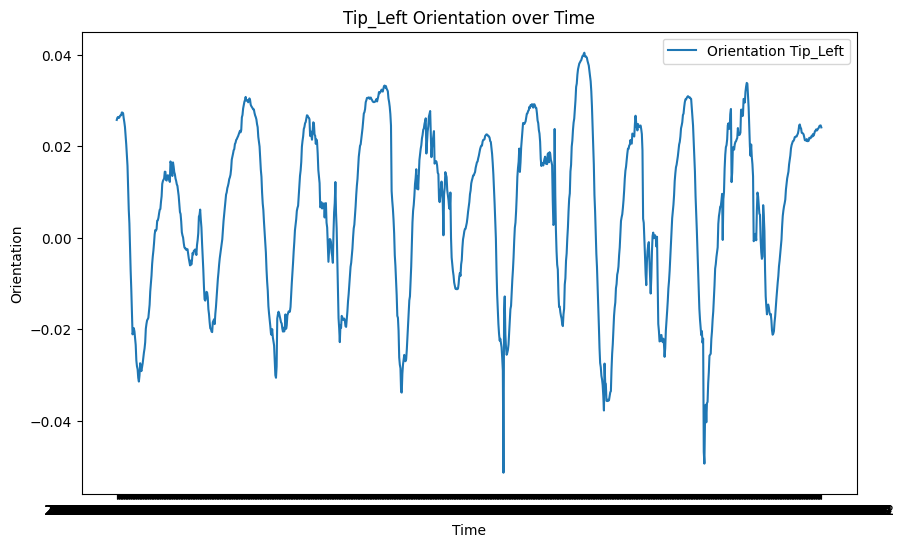

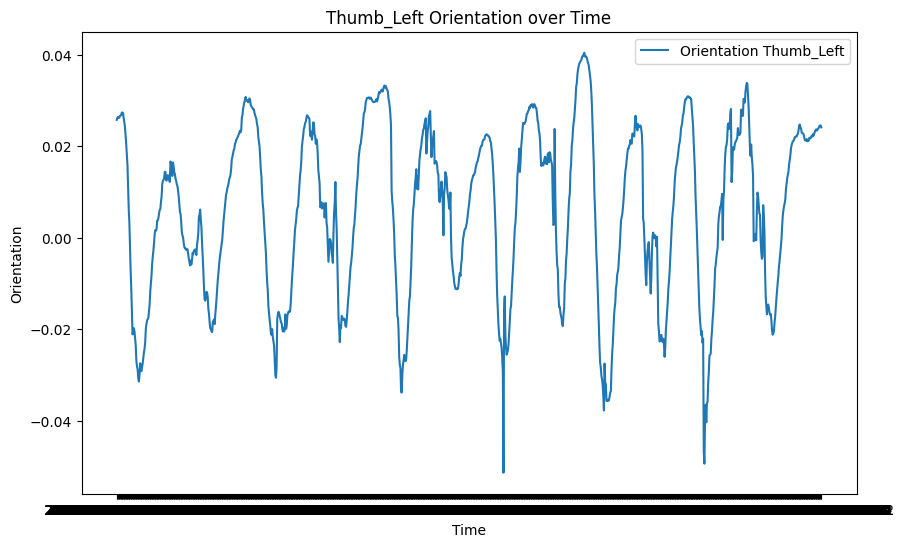

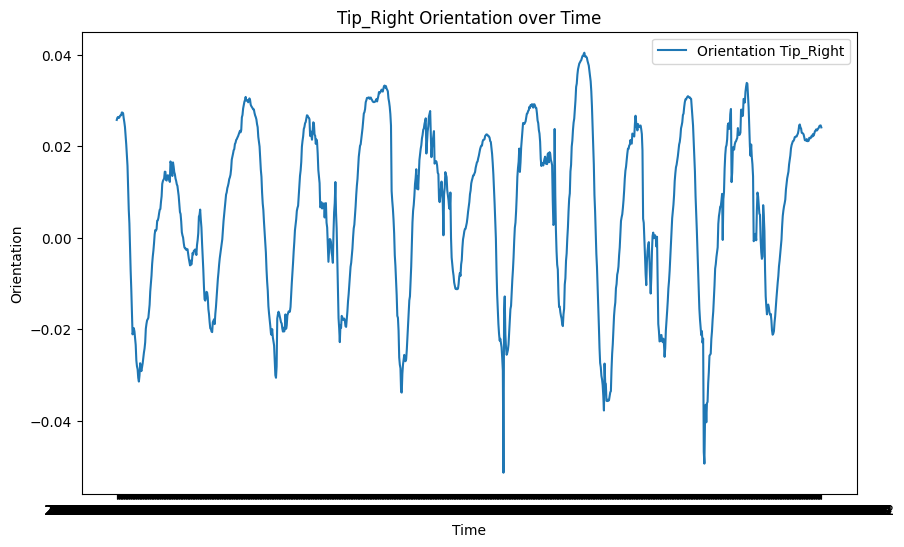

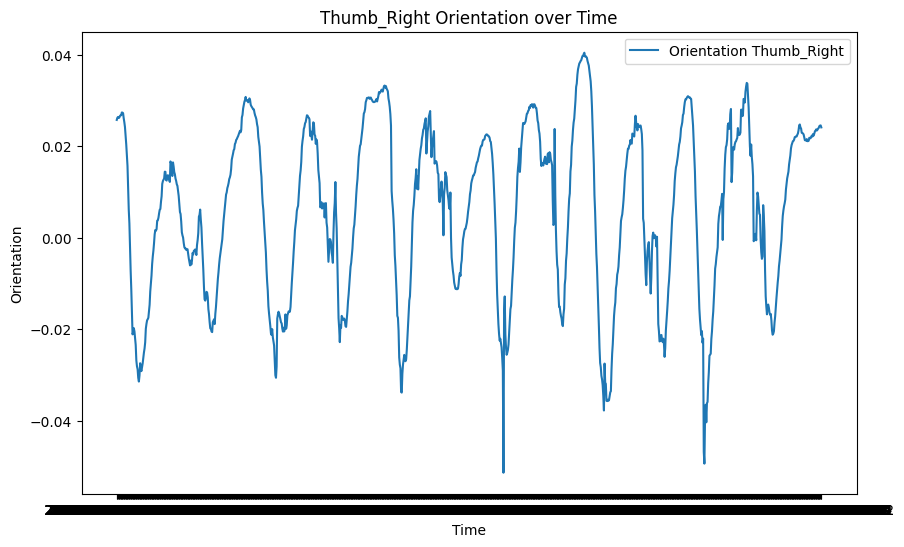

In [ ]:
import pandas as pd
import pyarrow as pya
import matplotlib.pyplot as plt
from datetime import datetime

# Load the data
jointposition_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/JointPosition011214_103748.csv', header=None)
jointorientation_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/JointOrientation011214_103748.csv', header=None)
timestamps_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/TimeStamp011214_103748.csv', header=None)

# Convert Unix timestamps to UTC
timestamps_df[0] = timestamps_df[0].apply(lambda x: datetime.utcfromtimestamp(x).strftime('%Y-%m-%d %H:%M:%S'))

# Set the timestamp as the index for all dataframes
jointposition_df.index = timestamps_df[0]
jointorientation_df.index = timestamps_df[0]

# Remove the first 18 rows
jointposition_df = jointposition_df.iloc[18:]
jointorientation_df = jointorientation_df.iloc[18:]

body_part_name = [
    'Spine_Base', 'Spine_Mid', 'Neck', 'Head', 'Shoulder_Left', 'Elbow_Left', 'Wrist_Left', 'Hand_Left','Shoulder_Right', 'Elbow_Right', 'Wrist_Right', 'Hand_Right', 'Hip_Left', 'Knee_Left', 'Ankle_Left','Foot_Left', 'Hip_Right', 'Knee_Right', 'Ankle_Right', 'Foot_Right', 'Spine_Shoulder', 'Tip_Left','Thumb_Left', 'Tip_Right', 'Thumb_Right'
]
body_part = [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 68, 72, 76, 80, 84, 88, 92, 96]
'''
# Extract and plot data for a specific body part (e.g., Spine_Base)
body_part_names = 'Spine_Base'
plt.figure(figsize=(10, 6))
plt.plot(jointposition_df[body_part], label=f'{body_part_names} Position')
plt.title(f'{body_part_name} Position over Time')
plt.xlabel('Time')
plt.ylabel('Position')
plt.legend()
plt.show()
'''

# For joint orientation, you may need to choose a specific joint (e.g., Neck) and plot the relevant orientation data.

# Example for Neck orientation
for idx in body_part:
    for bpn in body_part_name:
        plt.figure(figsize=(10, 6))
        plt.plot(jointorientation_df[idx], label=f'Orientation {bpn}')
        plt.title(f'{bpn} Orientation over Time')
        plt.xlabel('Time')
        plt.ylabel('Orientation')
        plt.legend()

plt.show()


Evaluates the Joint Position

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

# Load the data
jointposition_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/JointPosition011214_103748.csv', header=None)
jointorientation_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/JointOrientation011214_103748.csv', header=None)
timestamps_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/TimeStamp011214_103748.csv', header=None)

# Convert Unix timestamps to UTC
timestamps_df[0] = timestamps_df[0].apply(lambda x: datetime.utcfromtimestamp(x).strftime('%Y-%m-%d %H:%M:%S'))

# Set the timestamp as the index for all dataframes
jointposition_df.index = timestamps_df[0]
jointorientation_df.index = timestamps_df[0]

# Remove the first 18 rows
jointposition_df = jointposition_df.iloc[18:]
jointorientation_df = jointorientation_df.iloc[18:]

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

# Load the data
jointposition_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/JointPosition011214_103748.csv', header=None)
jointorientation_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/JointOrientation011214_103748.csv', header=None)
timestamps_df = pd.read_csv('data/CG/Expert/E_ID1/Es1/Raw/TimeStamp011214_103748.csv', header=None)

# Convert Unix timestamps to UTC
timestamps_df[0] = timestamps_df[0].apply(lambda x: datetime.utcfromtimestamp(x).strftime('%Y-%m-%d %H:%M:%S'))

# Set the timestamp as the index for all dataframes
jointposition_df.index = timestamps_df[0]
jointorientation_df.index = timestamps_df[0]

# Remove the first 18 rows
jointposition_df = jointposition_df.iloc[18:]
jointorientation_df = jointorientation_df.iloc[18:]

# Define body part indices
index_Spine_Base=0
index_Spine_Mid=4
index_Neck=8
index_Head=12   # no orientation
index_Shoulder_Left=16
index_Elbow_Left=20
index_Wrist_Left=24
index_Hand_Left=28
index_Shoulder_Right=32
index_Elbow_Right=36
index_Wrist_Right=40
index_Hand_Right=44
index_Hip_Left=48
index_Knee_Left=52
index_Ankle_Left=56
index_Foot_Left=60  # no orientation    
index_Hip_Right=64
index_Knee_Right=68
index_Ankle_Right=72
index_Foot_Right=76   # no orientation
index_Spine_Shoulder=80
index_Tip_Left=84     # no orientation
index_Thumb_Left=88   # no orientation
index_Tip_Right=92    # no orientation
index_Thumb_Right=96  # no orientation
body_part = [0, 4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64, 68, 72, 76, 76, 80, 84, 88, 92, 96]

# Extract and plot data for a specific body part (e.g., Spine_Base)
body_part_name = 'Spine_Base'
plt.figure(figsize=(10, 6))
plt.plot(jointposition_df[index_Spine_Base], label=f'{body_part_name} Position')
plt.title(f'{body_part_name} Position over Time')
plt.xlabel('Time')
plt.ylabel('Position')
plt.legend()
plt.show()

# For joint orientation, you may need to choose a specific joint (e.g., Neck) and plot the relevant orientation data.

# Example for Neck orientation
plt.figure(figsize=(10, 6))
for idx in body_part:
    plt.plot(jointorientation_df[idx], label=f'Orientation {idx}')
plt.title('Neck Orientation over Time')
plt.xlabel('Time')
plt.ylabel('Orientation')
plt.legend()
plt.show()


Evaluates the Joint Orientation

In [ ]:
import numpy as np


jo=np

Main evaluates everything (Kimore, JointPos, Exercises, JointOrientation)